Take a copy of this notebook for each model you will implement.

This is the initial notebook — any changes will be made here before starting model building to ensure consistency across all notebooks.

**Key Consistency Tips**

* Standardized Headings: Use identical section names across all notebooks.

* Code Comments: Explain non-trivial steps (e.g., "Handling class imbalance with SMOTE").

* Version Control: Add a requirements.txt in the repo for dependency management. مش لازم

* Outputs: Save all plots/figures to a /results folder with consistent naming (e.g., XGBoost_SHAP.png).
اعتقد هتبقى كويسة عشان واحنا بنعمل البيبر ما نقعدش ناخد سكرينات


* Reproducibility: Set global random seeds (e.g., np.random.seed(42)).

# **Imports**

In [ ]:
%%capture
!pip install -q lime shap PyALE
!pip install git+https://github.com/MaximeJumelle/ALEPython.git@dev#egg=alepython

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
import kagglehub, warnings
from sklearn.model_selection import train_test_split, learning_curve, ValidationCurveDisplay
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, RocCurveDisplay, auc, PrecisionRecallDisplay
from sklearn.inspection import PartialDependenceDisplay
from xgboost import XGBClassifier
from sklearn.tree import plot_tree
from itertools import combinations
from PyALE import ale
from matplotlib.collections import PolyCollection

warnings.filterwarnings('ignore')

# **Utils**

In [ ]:
def our_confusion_matrix(model, name='Model'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, cmap="Oranges", ax=ax1)
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap="Oranges", ax=ax2)
    plt.title(f"{name} Confusion Matrix")

def our_roc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    roc1 = RocCurveDisplay.from_estimator(
    model, X_train, y_train,
    name=name, ax=ax1,
    color="orange"
    )
    roc2 = RocCurveDisplay.from_estimator(
        model, X_test, y_test,
        name=name, ax=ax2,
        color="orange"
    )
    ax1.fill_between(roc1.fpr, roc1.tpr, alpha=0.4, color="orange")
    ax2.fill_between(roc2.fpr, roc2.tpr, alpha=0.4, color="orange")
    ax1.set_title(f"{name} Training ROC Curve", fontsize=16)
    ax2.set_title(f"{name} Testing ROC Curve", fontsize=16)
    for ax in [ax1, ax2]:
        ax.grid(alpha=0.5)

def our_learning_curve(model, name='Model'):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, cv=5, scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10), random_state=0
    )

    plt.figure(figsize=(13, 8))
    plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="mediumseagreen", label="Training score")
    plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="royalblue", label="Cross-validation score")
    plt.title(f"{name} Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.grid(alpha=0.5)

def our_prc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 13))
    train_disp = PrecisionRecallDisplay.from_estimator(model, X_train, y_train, ax=ax1, color='orange')
    test_disp = PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=ax2, color='orange')
    ax1.set_title(f"{name} Precision-Recall Curve - Train")
    ax2.set_title(f"{name} Precision-Recall Curve - Test")
    ax1.fill_between(train_disp.recall, train_disp.precision, alpha=0.4, color='orange')
    ax2.fill_between(test_disp.recall, test_disp.precision, alpha=0.4, color='orange')

# **Load Processed Dat**a

In [ ]:
path = kagglehub.dataset_download('mohamedhassan77/xai-project-processed-data')
df = pd.read_csv(f"{path}/combined_adasyn_train_test.csv")
df

100%|██████████| 145k/145k [00:00<00:00, 34.8MB/s]

Extracting files...


,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,promotion_velocity,workload_score,compensation_ratio,Attrition,Set
0,31,2,1062,1,24,3,3,3,0,96,...,3,10.0,9,1,8,9.999900,1,1.019760,0,Train
1,50,2,328,1,1,3,3,3,1,86,...,2,3.0,2,0,2,300000.000000,2,1.281918,0,Train
2,46,2,717,1,13,4,1,3,1,34,...,3,10.0,7,0,9,1000000.000000,1,0.832635,0,Train
3,44,2,170,1,1,4,1,2,1,78,...,3,2.0,0,2,2,0.999995,1,0.753443,0,Train
4,26,1,1479,1,1,3,1,3,0,84,...,1,6.0,5,1,4,5.999940,3,1.007878,0,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,56,2,1162,1,24,2,1,1,1,97,...,3,4.0,2,1,0,3.999960,1,0.898732,1,Test
2043,46,2,669,2,9,2,3,3,1,64,...,3,9.0,8,4,7,2.249994,1,1.558490,1,Test
2044,30,2,1240,0,9,3,0,3,1,48,...,1,11.0,9,4,7,2.749993,7,2.052053,0,Test
2045,31,2,741,1,2,4,1,2,1,69,...,4,5.0,2,0,3,500000.000000,0,1.207921,0,Test


In [ ]:
train_df = df[df['Set'] == 'Train'].drop(columns=['Set'])
test_df = df[df['Set'] == 'Test'].drop(columns=['Set'])

X_train = train_df.drop(columns=['Attrition'])
y_train = train_df['Attrition']

X_test = test_df.drop(columns=['Attrition'])
y_test = test_df['Attrition']

print("X_train:", X_train.shape, "y_train:", y_train.shape)
print("X_test:", X_test.shape, "y_test:", y_test.shape)

X_train: (1589, 33) y_train: (1589,)
X_test: (458, 33) y_test: (458,)


# **Modeling**

In [ ]:
tryxgb = XGBClassifier(reg_alpha=0.0, reg_lambda=1.0)
tryxgb.fit(X_train, y_train)
tryxgb.score(X_train, y_train), tryxgb.score(X_test, y_test)

(1.0, 0.8275109170305677)

In [ ]:
xgb = XGBClassifier(reg_alpha=0.0, reg_lambda=1.0)
xgb.fit(X_train, y_train)
xgb.score(X_train, y_train), xgb.score(X_test, y_test)

(1.0, 0.8275109170305677)

<Figure size 2100x1300 with 0 Axes>

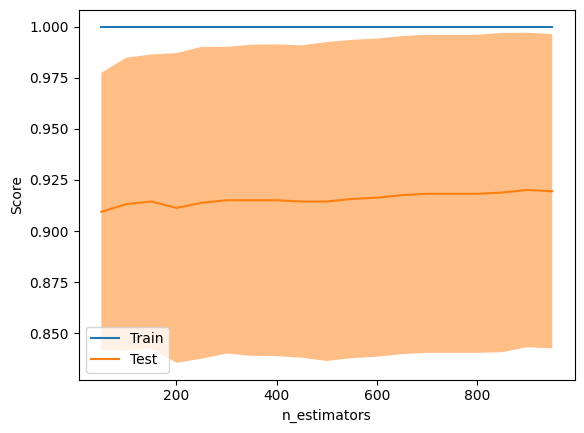

In [ ]:
from sklearn.model_selection import ValidationCurveDisplay, validation_curve

param_name, param_range = "n_estimators", np.arange(50, 1000, 50)
train_scores, test_scores = validation_curve(
    xgb, X_train, y_train, param_name=param_name, param_range=param_range
)
plt.figure(figsize=(21, 13))
display = ValidationCurveDisplay(
    param_name=param_name, param_range=param_range,
    train_scores=train_scores, test_scores=test_scores, score_name="Score"
)
display.plot()

The validation curve shows that training accuracy is always 1 whatever trees you add, while cross‑validation accuracy shows no much change. The model shows very high variance on the test dataset. while in training it is much more consistent

# **Model Evaluation**

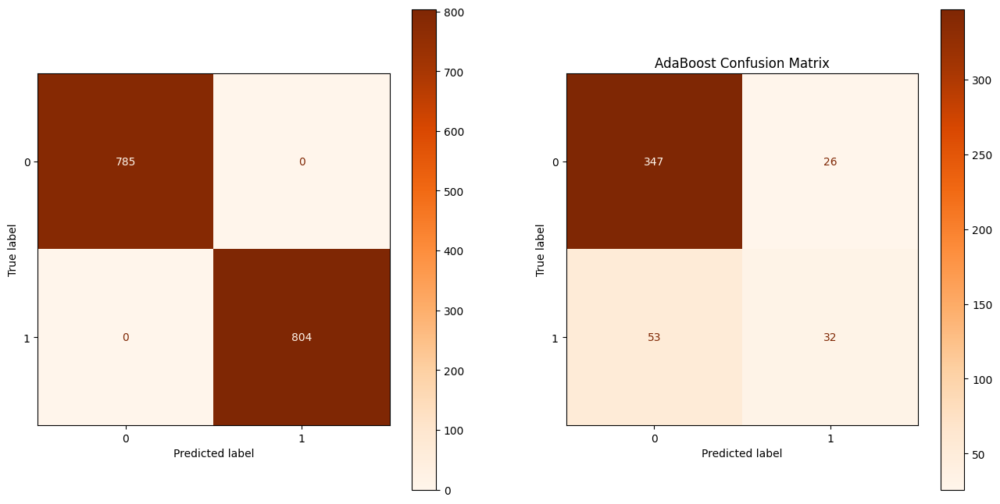

In [ ]:
our_confusion_matrix(xgb, "AdaBoost")

the model struggles with identifying class 1 on the test dataset

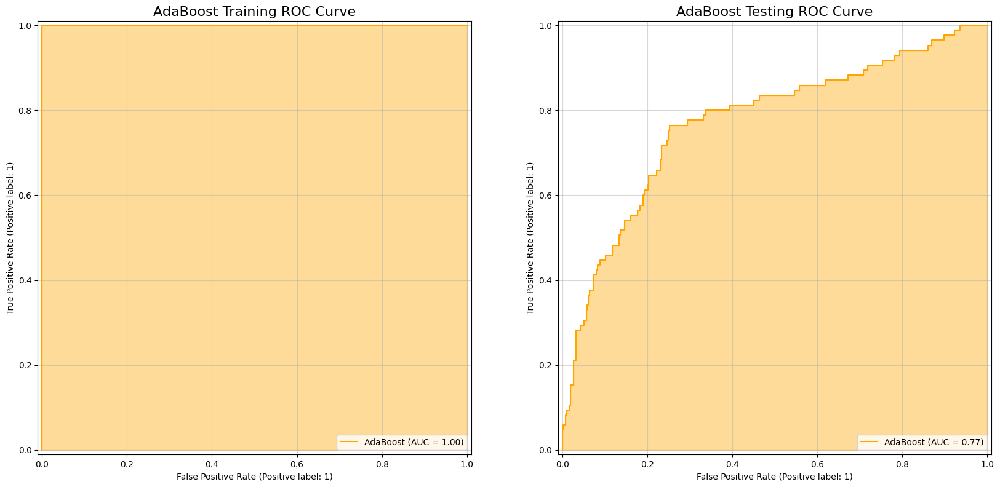

In [ ]:
our_roc(xgb, "AdaBoost")

The model shows high area under the curve AUC on the training data AUC = 1 while it shows low AUC AUC = 0.77 on the test data. This implies overfitting

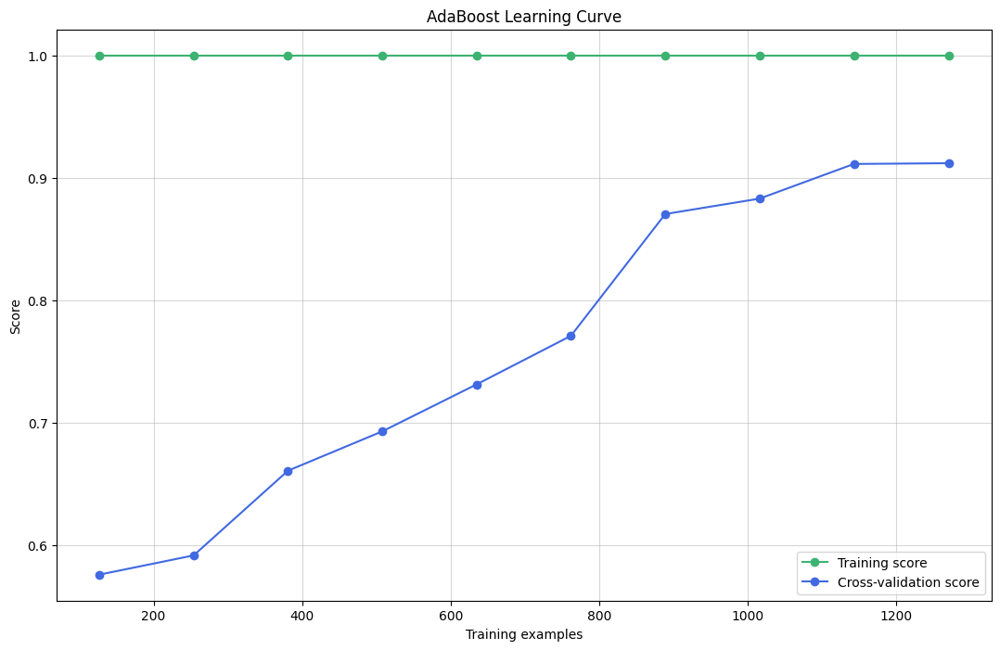

In [ ]:
our_learning_curve(xgb, "AdaBoost")

XGBoost was perfect on the training data whatever its size was.

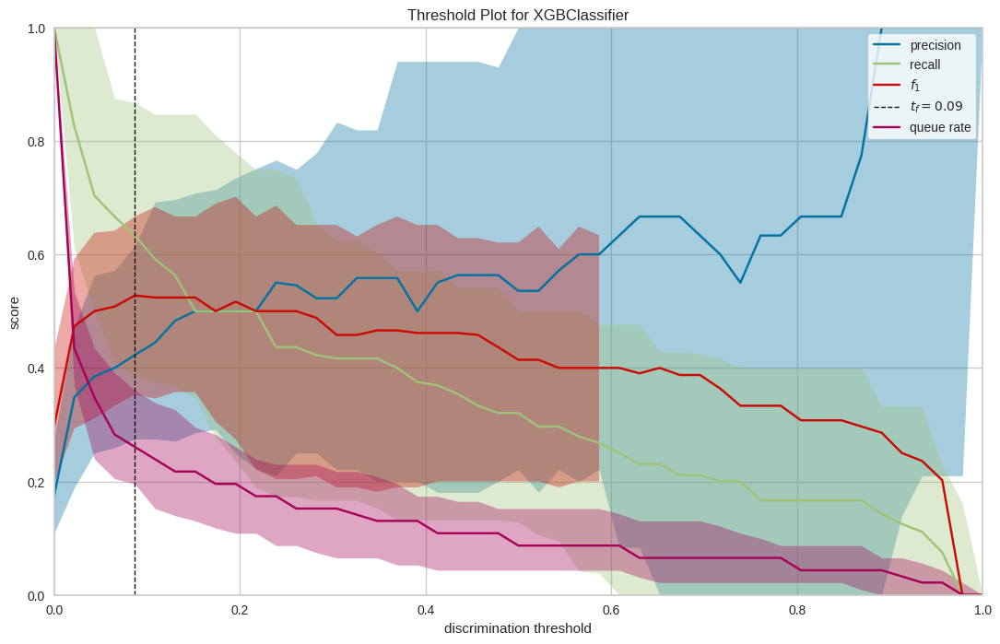

<Axes: title={'center': 'Threshold Plot for XGBClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [ ]:
from yellowbrick.classifier import DiscriminationThreshold
plt.figure(figsize=(13, 8))
DiscriminationThreshold(xgb).fit(X_test, y_test).poof()

The perfect f1 score happens at 0.09 discrimination threshold

# **Explainability Techniques**

## Feature Importance (Model-Specific)

[Text(3, 0, '0.005'),
 Text(3, 0, '0.006'),
 Text(3, 0, '0.010'),
 Text(3, 0, '0.010'),
 Text(3, 0, '0.010'),
 Text(3, 0, '0.011'),
 Text(3, 0, '0.011'),
 Text(3, 0, '0.012'),
 Text(3, 0, '0.013'),
 Text(3, 0, '0.013'),
 Text(3, 0, '0.013'),
 Text(3, 0, '0.013'),
 Text(3, 0, '0.014'),
 Text(3, 0, '0.016'),
 Text(3, 0, '0.016'),
 Text(3, 0, '0.019'),
 Text(3, 0, '0.020'),
 Text(3, 0, '0.020'),
 Text(3, 0, '0.021'),
 Text(3, 0, '0.021'),
 Text(3, 0, '0.022'),
 Text(3, 0, '0.023'),
 Text(3, 0, '0.027'),
 Text(3, 0, '0.027'),
 Text(3, 0, '0.030'),
 Text(3, 0, '0.048'),
 Text(3, 0, '0.051'),
 Text(3, 0, '0.054'),
 Text(3, 0, '0.054'),
 Text(3, 0, '0.059'),
 Text(3, 0, '0.086'),
 Text(3, 0, '0.090'),
 Text(3, 0, '0.159')]

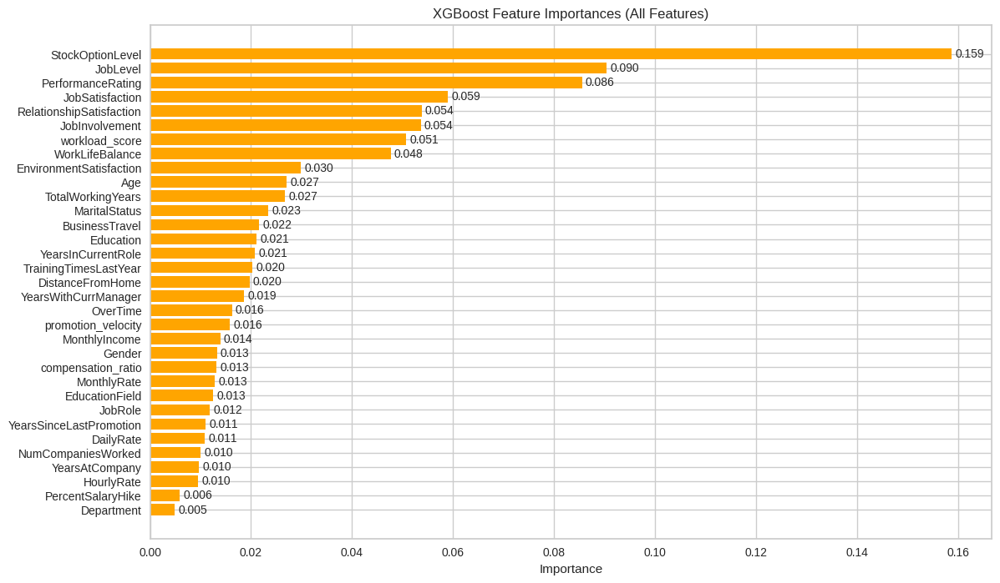

In [ ]:
importances = xgb.feature_importances_
feat_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(13, 8))
ax = plt.gca()
bars = ax.barh(X_train.columns[feat_idx][::-1], importances[feat_idx][::-1], color="orange")
ax.set_xlabel("Importance")
ax.set_title("XGBoost Feature Importances (All Features)")
ax.bar_label(bars, fmt="%.3f", padding=3, fontsize=10)

- The model prioritizes employee related metrics (satisfaction, workload, engagement)

-  Focus on improving job satisfaction, managing workloads, and aligning stock incentives for better results.

## Partial Dependence Plots (PDP)

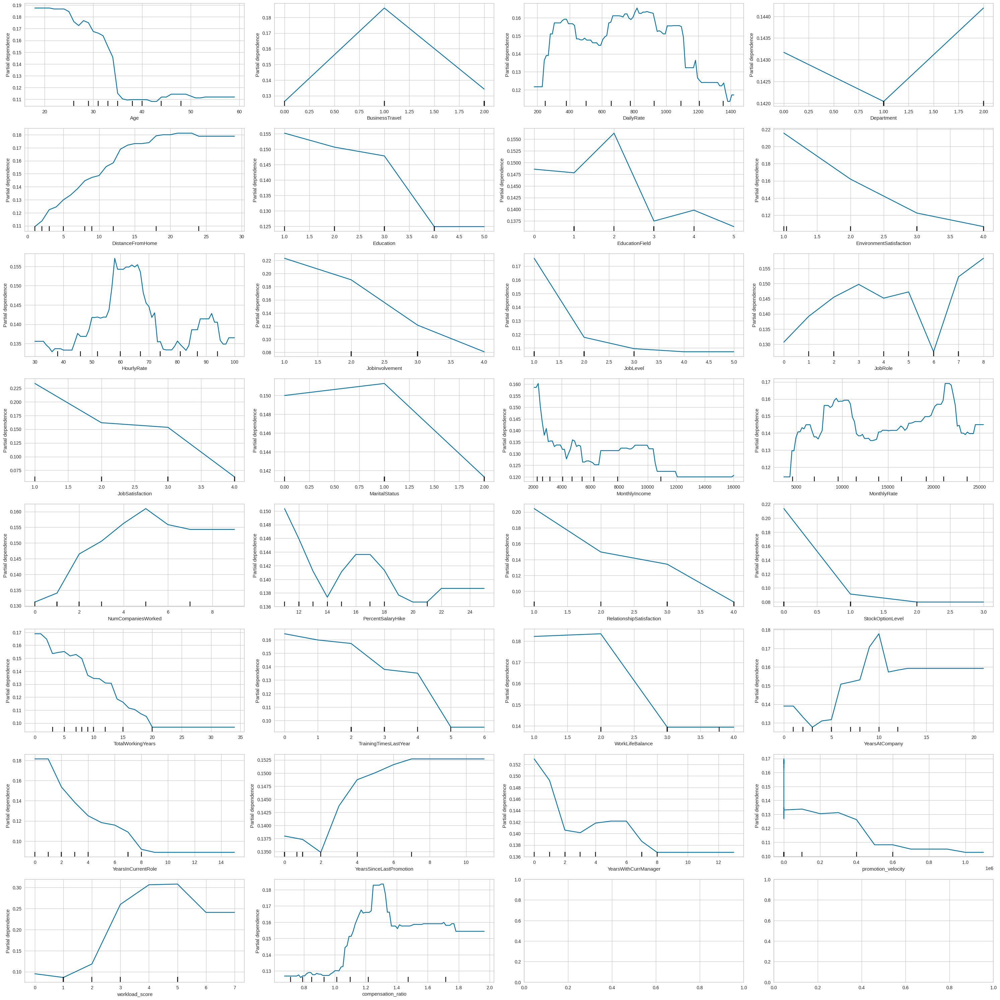

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(30, 30))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        xgb, X_test, [feat], ax=ax)
plt.tight_layout()

- Model is influenced mainly by financial ratios (int_rate, Debt_To_Income), loan amount, income, and credit grade.

- Many features have negligible or redundant contributions.

<!-- Interpretation supports possible feature pruning or simplification for explainability. -->

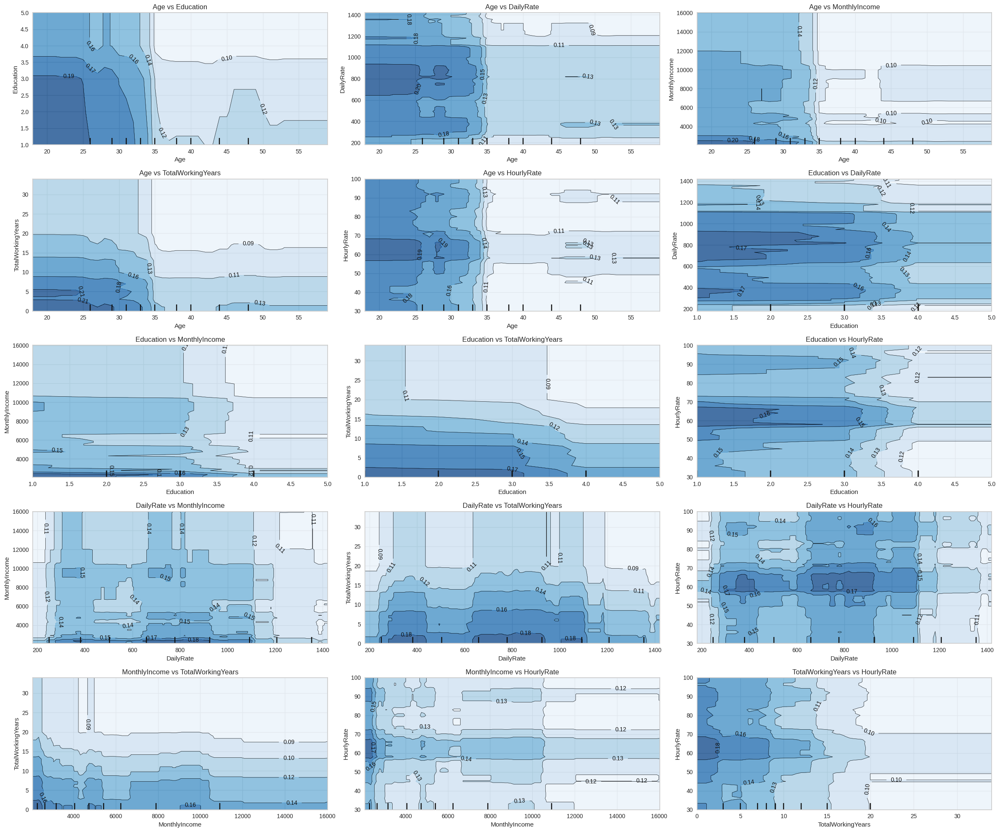

In [ ]:
important_features = ['Age', 'Education', "DailyRate", "MonthlyIncome", "TotalWorkingYears", "HourlyRate"]
feature_pairs = []
for i in range(len(important_features)):
    for j in range(i+1, len(important_features)):
        feature_pairs.append((important_features[i], important_features[j]))

n_pairs = len(feature_pairs)
n_cols = 3
n_rows = (n_pairs + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 4*n_rows))

for ax, feat_pair in zip(axes.flatten(), feature_pairs):
    PartialDependenceDisplay.from_estimator(
        xgb, X_test, [feat_pair], ax=ax,
        kind='average', contour_kw={'cmap': 'Blues'})
    ax.set_title(f'{feat_pair[0]} vs {feat_pair[1]}')

plt.tight_layout()

Most interaction plots are almost flat, showing that combining any two of these features barely changes the predicted attrition probability. Key takeaways:

Predictions are driven by each feature’s individual effect rather than their synergy.
Probability shifts remain very small (≈±0.02–0.03) across the contour surfaces.
The most noticeable—but still minor—variation appears in the Education vs BusinessTravel plot; all others show negligible joint influence.

## ICE

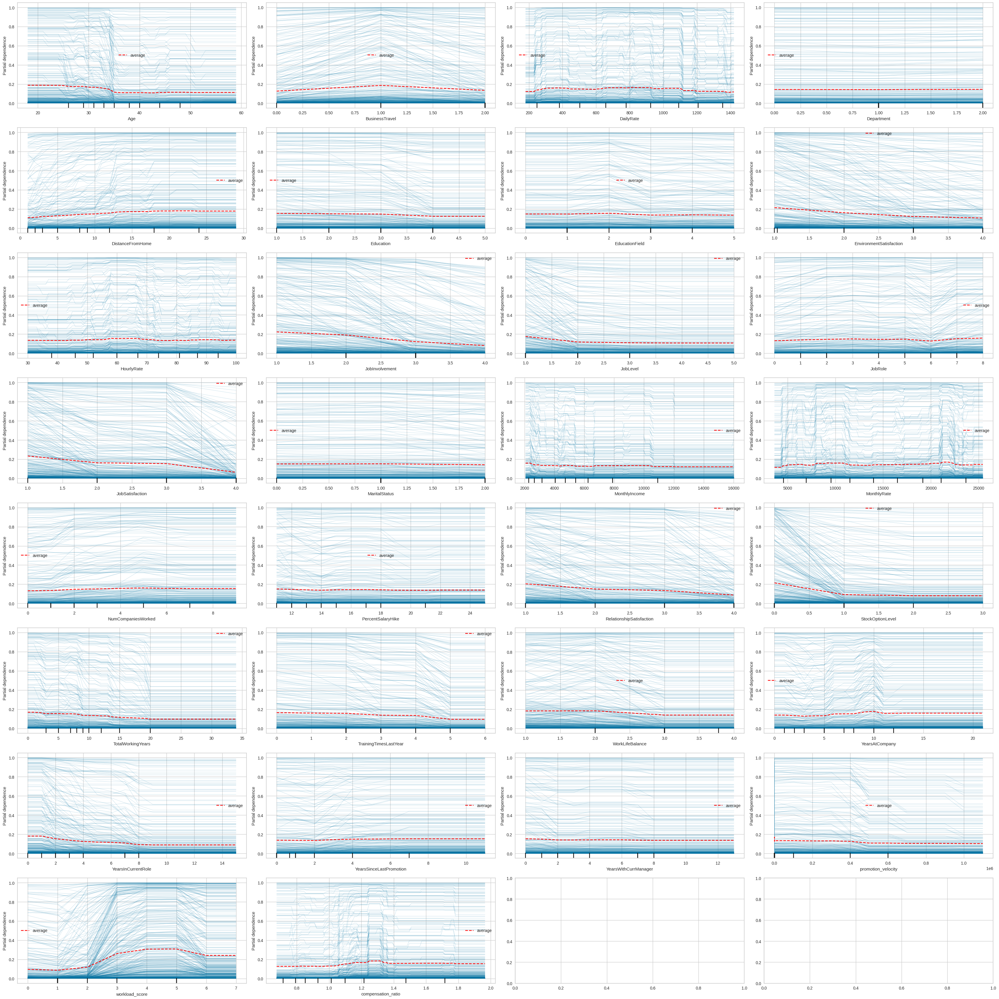

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(34, 34))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        xgb, X_test, [feat], ax=ax,
        kind='both', pd_line_kw={'color':'red'}
        )
plt.tight_layout()

Most features show negligible impact on predictions. Weak positive correlations exist for satisfaction metrics (environment, job, relationship, work-life balance) and tenure-related factors (total working years, years at company, role tenure).

Weak negative trends appear in financial metrics (daily/hourly rates, salary hike) and stock options.

Workload and compensation ratio also show slight positive links.

No meaningful influence from demographics, department, job role, or promotion velocity.


## LIME Analysis

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
explainer = LimeTabularExplainer(X_train.values,
                                 feature_names = list(X_train.columns),
                                 class_names = ['Attrition', 'No Attrition'])
explainer.explain_instance(X_test.values[2],
                           xgb.predict_proba).show_in_notebook()

The probability of this employee's attrition is low. Many factors support that such as `StockOptionLevel`, `JobInvolvement`, `JobSatisfaction`, `EnvironmentSatisfaction`, `RelationshipSatisfaction`


## SHAP Analysis

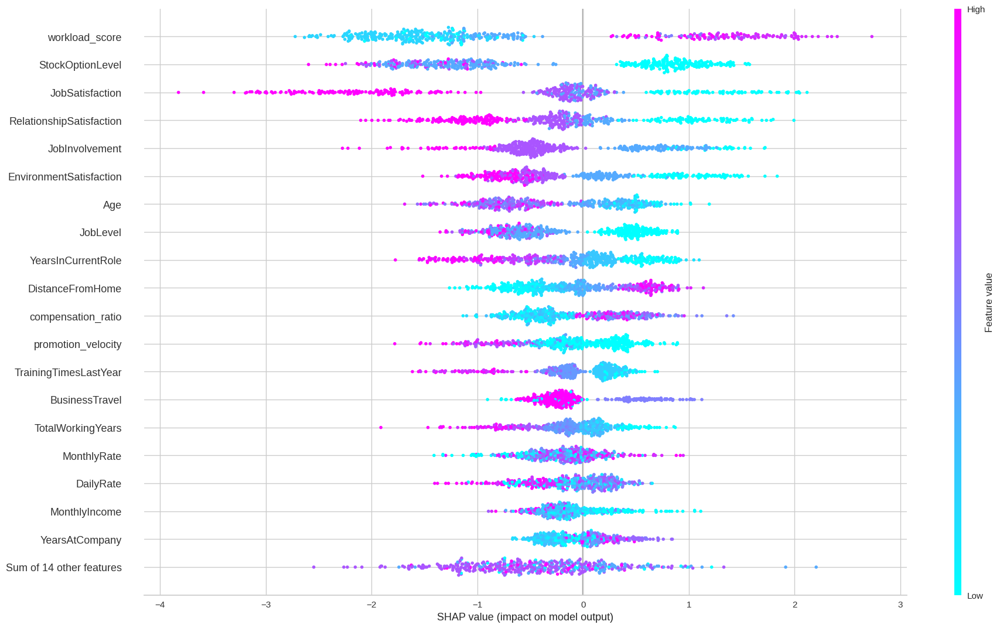

In [ ]:
import shap
explainer = shap.TreeExplainer(xgb)
explanation = explainer(X_test)
shap.plots.beeswarm(explanation, plot_size=(21, 13),
                    color=plt.get_cmap("cool"), max_display=20)

"workload_score", "StockOptionLevel", and "JobSatisfaction" have the highest impact on the model's output, with a wide range of SHAP values. "YearsAtCompany" and "MonthlyIncome" show smaller impacts. Positive SHAP values increase predictions, while negative values decrease them.

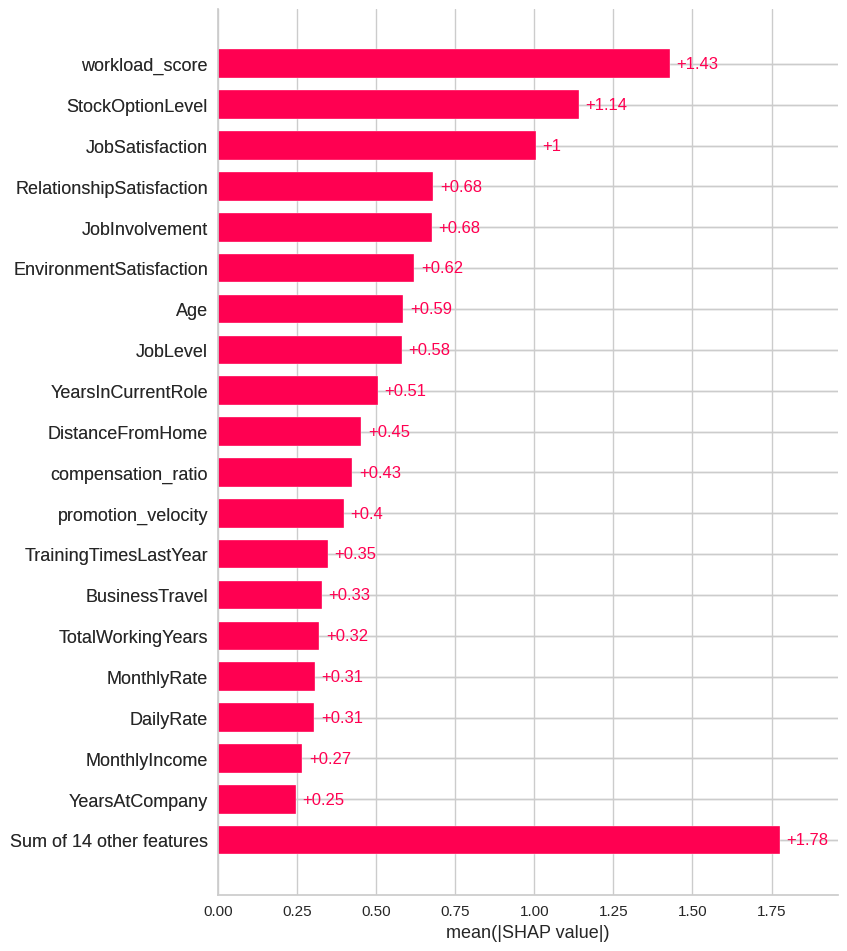

In [ ]:
shap.plots.bar(explanation, max_display=20)

This bar plot agrees to what we said at the previous interpretation.

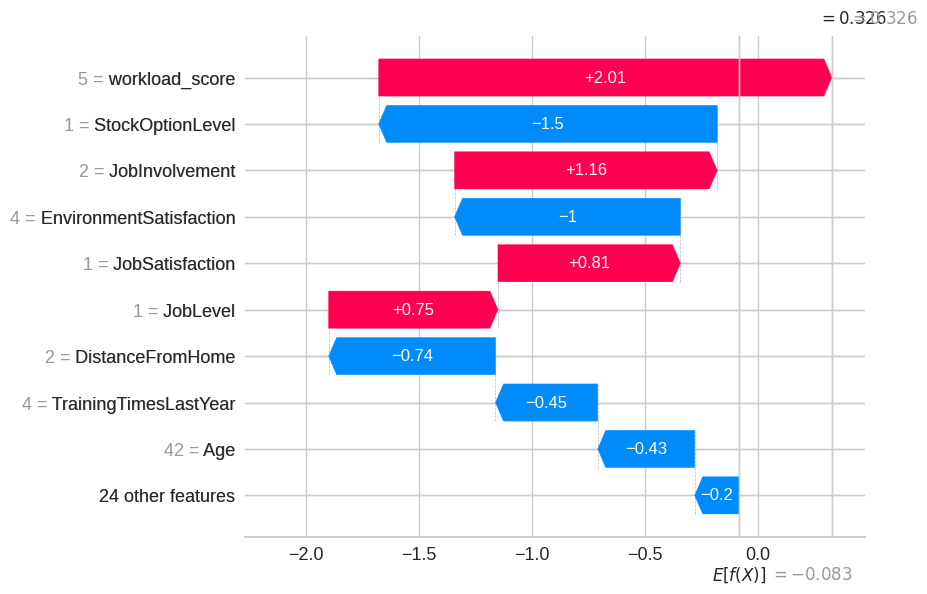

In [ ]:
shap.plots.waterfall(explanation[5])

The expected model output E[f(X)] is -0.083."workload_score" (+2.01) and "JobInvolvement" (+1.16) have the largest positive impact on the model's output. "StockOptionLevel" (-1.5) and "EnvironmentSatisfaction" (-1.0) have the largest negative impact.

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0, :], features=list(X_train.columns))

"RelationshipSatisfaction," "TotalWorkingYears," and "Age" are the strongest positive drivers (red, pushing the prediction from -6.083 to 3.22). "Workload_score," "DailyRate," and "BusinessTravel" are the strongest negative drivers (blue, pushing the prediction down). The final prediction is 3.22.

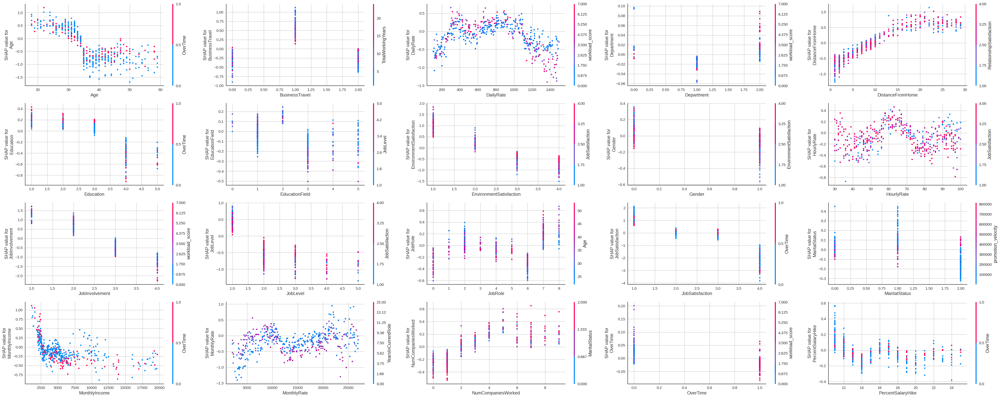

In [ ]:
fig, axs = plt.subplots(4, 5, figsize=(40, 16))
axs = axs.flatten()
for ax, i in zip(axs, range(20)):
    shap.dependence_plot(i, shap_values, X_test, ax=ax, show=False)
plt.tight_layout()

This plots show how features impact the model output. "Age," "DistanceFromHome," "HourlyRate," "MonthlyIncome," and "MonthlyRate" show varied SHAP values, with some positive and negative impacts. "BusinessTravel," "Education," "EnvironmentSatisfaction," "Gender," "JobInvolvement," "JobLevel," "JobSatisfaction," "MaritalStatus," "NumCompaniesWorked," "OverTime," and "PercentSalaryHike" have more clustered SHAP values, indicating less varied impact. Blue dots (lower values) and red dots (higher values) show feature value distribution.

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0:100, :], X_test.iloc[0:100, :])

This plot visualizes contributions of features for multiple instances. Red areas shows positive SHAP values that increase predictions. Blue areas shows negative SHAP values and decrease predictions.

## ALE

### 1D

In [ ]:
from PyALE import ale

# wrapper with .predict function
class ProbaWrapper:
    def __init__(self, m):
         self.m = m
    def predict(self, X):
         return self.m.predict_proba(X)[:,1]

pw = ProbaWrapper(xgb)

INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_g

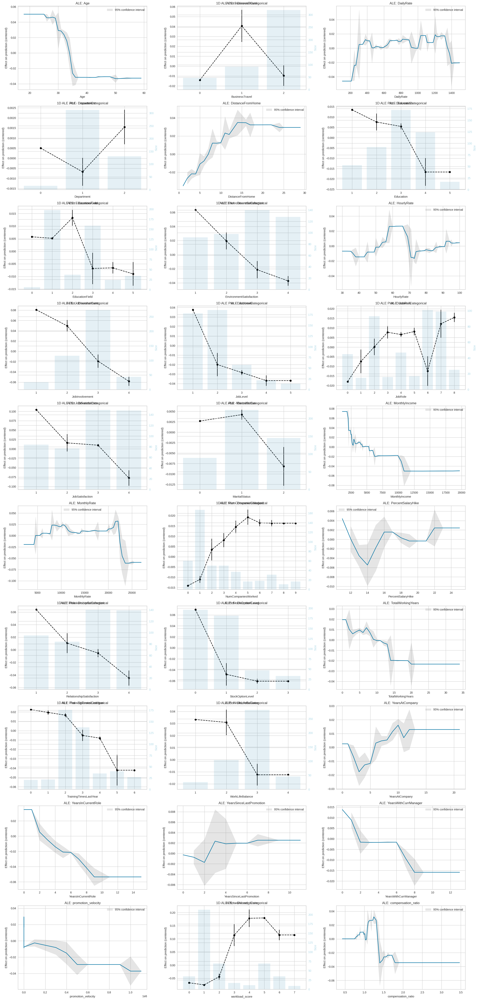

In [ ]:
cont = [c for c in X_test.columns if X_test[c].nunique()>2]
n_cols = 3
n_rows = (len(cont) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(8*n_cols, 5*n_rows))
axes = axes.flatten()

for ax, feat in zip(axes, cont):
    ale(X=X_test, model=pw, feature=[feat],
        grid_size=50, include_CI=True, C=0.95,
        fig=fig, ax=ax)
    ax.set_title(f"ALE: {feat}")

for ax in axes[len(cont):]:
    ax.set_visible(False)

plt.tight_layout()

"Age," "DistanceFromHome," "MonthlyIncome," and "TotalWorkingYears" have the largest negative effects (up to -0.8). "DailyRate," "HourlyRate," and "MonthlyRate" show smaller negative effects (-0.2). "PercentSalaryHike" and "YearsSinceLastPromotion" have mixed effects. Shaded areas are the 95% confidence intervals.

### 2D ALE

In [ ]:
xgb.predict = lambda X: xgb.predict_proba(X)[:,1]
feats = [c for c in X_test if X_test[c].nunique()>2]
pairs = list(combinations(feats,2))[:6]

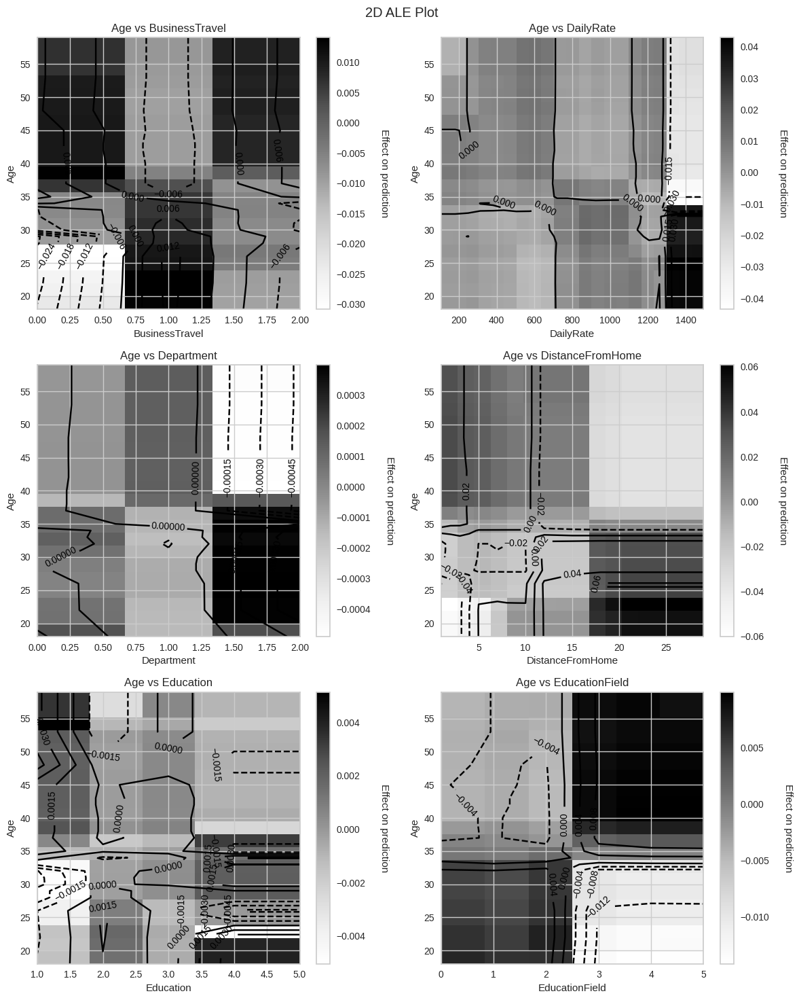

In [ ]:
fig, axes = plt.subplots((len(pairs)+1)//2,2,
                         figsize=(12,5*((len(pairs)+1)//2)))
for ax,(f1,f2) in zip(axes.flat,pairs):
    ale(X_test, xgb, [f1,f2], grid_size=20,
        contour=True, include_CI=False,
        fig=fig, ax=ax)
    for coll in ax.collections:
        if isinstance(coll, PolyCollection):
            coll.set_cmap('plasma')
    ax.set_title(f"{f1} vs {f2}")

plt.tight_layout()